# MOwNiT
## Laboratorium 1 - Arytmetyka komputerowa

In [1]:
decode(x::Float16) = (b=bitstring(x); (b[1], b[2:6], b[7:16]))
decode(x::Float32) = (b=bitstring(x); (b[1], b[2:9], b[10:32]))
decode(x::Float64) = (b=bitstring(x); (b[1], b[2:12], b[13:54]))

decode (generic function with 3 methods)

## Zad 1

In [2]:
println(Float16(1/3))
println(Float32(1/3))
println(Float64(1/3))

0.3333
0.33333334
0.3333333333333333


In [3]:
println(decode(Float16(1/3)))
println(decode(Float32(1/3)))
println(decode(Float64(1/3)))

('0', "01101", "0101010101")
('0', "01111101", "01010101010101010101011")
('0', "01111111101", "010101010101010101010101010101010101010101")


In [4]:
println(Float16(Float64(1/3)))
println(Float16(Float32(1/3)))

println(Float32(Float16(1/3)))
println(Float32(Float64(1/3)))

println(Float64(Float16(1/3)))
println(Float64(Float32(1/3)))

0.3333
0.3333
0.33325195
0.33333334
0.333251953125
0.3333333432674408


In [5]:
println(decode(Float16(1/3)))
println(decode(Float64(1/3)))
println(decode(Float64(Float16(1/3))))

('0', "01101", "0101010101")
('0', "01111111101", "010101010101010101010101010101010101010101")
('0', "01111111101", "010101010100000000000000000000000000000000")


## Zad 2

In [6]:
result = Float32[]
r = 1.0 : 1000000.0
for i = 1:1000000
    push!(result, nextfloat(r[i]) - r[i])
end

In [7]:
using Plots

In [8]:
plot(1:1000000, result)

## Zad 3

In [40]:
#=
#include <stdio.h>
#include <gsl/gsl_ieee_utils.h>

int main (void)
{
  double a = 1.0;

  while (a > 0.0){
    a = a / 2.0;
    gsl_ieee_double_rep r;
    gsl_ieee_double_to_rep(&a, &r);

    printf("a = %d , rep = ",a);gsl_ieee_printf_double(&a);
    printf(" type = %d %s \n",
            r.type,
            r.type == 3 ? "NORMAL" : r.type == 4 ? "DENORMAL" : "ZERO");
  }
  return 0;
}
=#


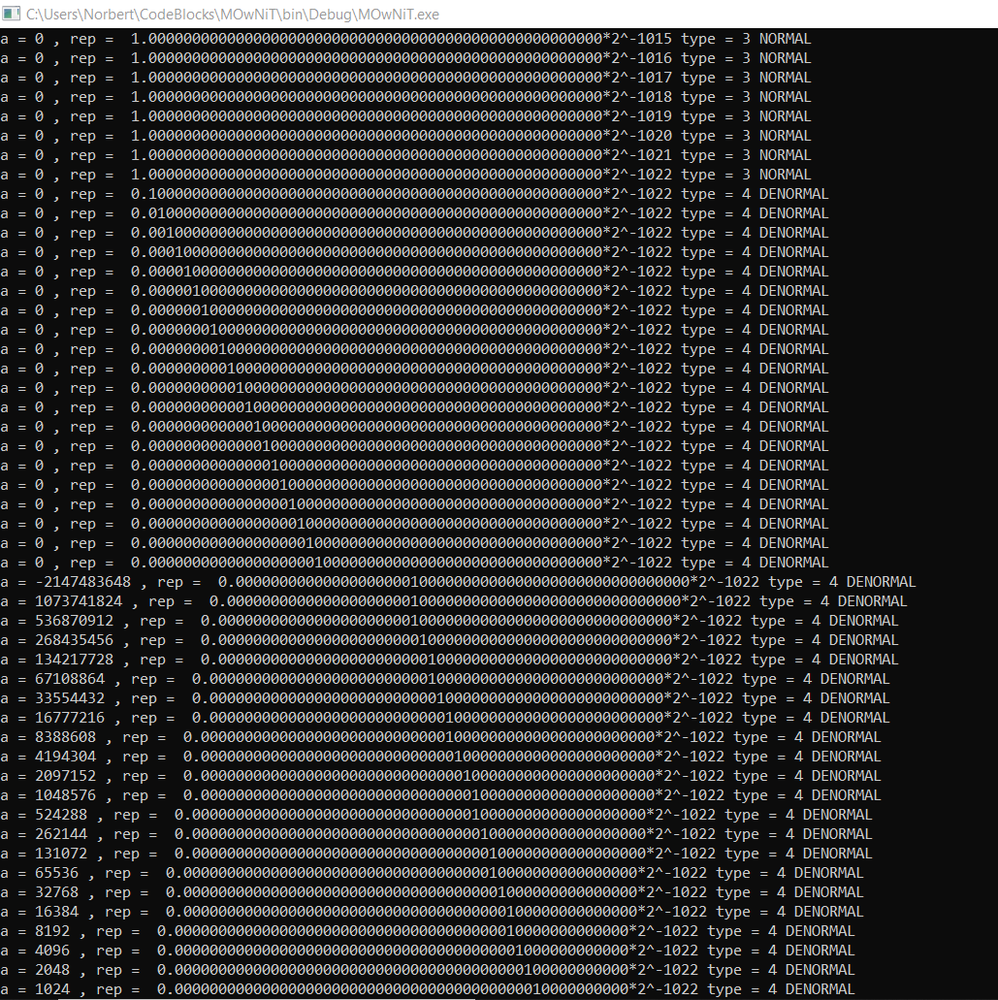

In [41]:
#  Mantysa przestaje być znormalizowana ponieważ zabrakło bitów na reprezentowanie wykładnika tzn. wszystkie bity są równe 0
# następuje denormalizacja mantysy 1.xxxx -> 0.xxxx

## Zad 4

In [35]:
# S(n) = integral x^n / (x + 9) dx : x (0:1)
# => S(n) = 1/n - 9S(n-1)
# S(0) = ln(10) - ln(9)
S_integral_unstable(n) = n == 0 ? log(10) - log(9) : 1/n - 9 * S_integral(n-1)

for i = 0:30
    println("n=", i, " : ", S_integral_unstable(i))
end

n=0 : 0.10536051565782634
n=1 : 0.05175535907956297
n=2 : 0.03420176828393329
n=3 : 0.02551741877793373
n=4 : 0.020343230998596418
n=5 : 0.016910921012632252
n=6 : 0.014468377552976391
n=7 : 0.012641744880355327
n=8 : 0.01122429607680206
n=9 : 0.01009244641989257
n=10 : 0.009167982220966875
n=11 : 0.008397250920389038
n=12 : 0.007758075049831989
n=13 : 0.007100401474589027
n=14 : 0.007524958157270181
n=15 : -0.0010579567487649655
n=16 : 0.07202161073888469
n=17 : -0.5893709672381975
n=18 : 5.359894260699333
n=19 : -48.18641676734663
n=20 : 433.72775090611964
n=21 : -3903.5021391074574
n=22 : 35131.564706512574
n=23 : -316184.0388803523
n=24 : 2.845656391589837e6
n=25 : -2.5610907484308533e7
n=26 : 2.3049816739723834e8
n=27 : -2.0744835065381079e9
n=28 : 1.8670351558878685e10
n=29 : -1.680331640298737e11
n=30 : 1.5122984762688967e12


In [36]:
# Przekształcenie wzoru na:
# S(n-1) = 1/(9n) - S(n)/9
# S(100) = S(99) => S(100) + 9S(100) = 1/100 => S(100) = 1/1000
S_integral_stable(n) = n == 100 ? 1/1000 : 1/(9*(n+1)) - S_integral_stable(n+1) * 1/9

for i = 0:30
    println("n=", i, " : ", S_integral_stable(i))
end

n=0 : 0.1053605156578263
n=1 : 0.05175535907956329
n=2 : 0.0342017682839304
n=3 : 0.02551741877795974
n=4 : 0.020343230998362355
n=5 : 0.016910921014738817
n=6 : 0.01446837753401731
n=7 : 0.012641745050987058
n=8 : 0.011224294541116477
n=9 : 0.01009246024106281
n=10 : 0.009167857830434716
n=11 : 0.008398370435178474
n=12 : 0.007747999416727072
n=13 : 0.007191082172533281
n=14 : 0.006708831875771901
n=15 : 0.0062871797847195545
n=16 : 0.005915381937524009
n=17 : 0.0055850919740486294
n=18 : 0.005289727789117886
n=19 : 0.005024028845307447
n=20 : 0.0047837403922329795
n=21 : 0.004565384088950802
n=22 : 0.0043660886539882435
n=23 : 0.0041834629836710255
n=24 : 0.004015499813627437
n=25 : 0.0038605016773530666
n=26 : 0.0037170233653608664
n=27 : 0.0035838267487892403
n=28 : 0.003459844975182551
n=29 : 0.003344153844046694
n=30 : 0.0032359487369130894


In [38]:
# Algorytm niestabilny ponieważ błąd przy reprezentacji wartości wyrazu pierwszego jest mnożony przez '9'
# przy liczeniu kolejnych wartości.